# Imports

In [10]:
from helpers import evaluate_policy, plot_evaluation_results
from algorithms import dyna_Q, PS_DynaQ
import gym
import matplotlib.pyplot as plt
from itertools import product

# Dyna Q

In [2]:
env = gym.make("Blackjack-v1")
Q, rewards = dyna_Q(env=env)
avg_reward = evaluate_policy(env, Q, episodes=100)
print(f"Average reward over 1000 test games: {avg_reward:.2f}")

/home/armenghazaryan/workspace/remote_envs/black-jack/lib/python3.11/site-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/armenghazaryan/workspace/remote_envs/black-jack/lib/python3.11/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Current state: player's sum 21, dealer's card: 9. Action taken: 0
Current state: player's sum 25, dealer's card: 3. Action taken: 1
Current state: player's sum 20, dealer's card: 8. Action taken: 0
Current state: player's sum 23, dealer's card: 8. Action taken: 1
Current state: player's sum 21, dealer's card: 10. Action taken: 0
Current state: player's sum 18, dealer's card: 6. Action taken: 1
Current state: player's sum 25, dealer's card: 6. Action taken: 1
Current state: player's sum 23, dealer's card: 9. Action taken: 1
Current state: player's sum 21, dealer's card: 6. Action taken: 0
Current state: player's sum 22, dealer's card: 10. Action taken: 1
Current state: player's sum 16, dealer's card: 1. Action taken: 1
Current state: player's sum 24, dealer's card: 1. Action taken: 1
Current state: player's sum 23, dealer's card: 10. Action taken: 1
Current state: player's sum 19, dealer's card: 5. Action taken: 0
Current state: player's sum 26, dealer's card: 6. Action taken: 1
Current

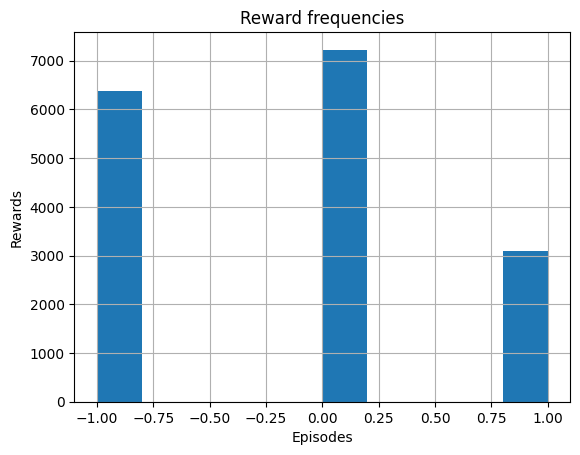

In [3]:
plt.hist(rewards)
plt.xlabel("Episodes")
plt.ylabel("Rewards")
plt.title("Reward frequencies")
plt.grid()
plt.show()

In [4]:
def dyna_q_testing(
        alpha_values=[0.1, 0.2, 0.3, 0.4],
        gamma_values=[0.9, 0.8, 0.7],
        episodes_list=[1000, 2000, 3000, 4000, 5000],
        planning_steps=10,
        n_episodes=1000,
        k=None
    ) -> list[tuple]:

    results = []

    for alpha, gamma, episodes in product(alpha_values, gamma_values, episodes_list):
        env = gym.make("Blackjack-v1")

        Q, rewards_over_time = dyna_Q(env, alpha=alpha, gamma=gamma, planning_steps=planning_steps, episodes=episodes, k=k)
        avg_reward = evaluate_policy(env, Q, episodes=n_episodes)
        results.append((alpha, gamma, episodes, avg_reward))
        print(f"α={alpha}, γ={gamma}, episodes={episodes} → avg_reward={avg_reward:.3f}")

    return results

In [5]:
results = dyna_q_testing()

Current state: player's sum 19, dealer's card: 10. Action taken: 1
Current state: player's sum 19, dealer's card: 10. Action taken: 0
Current state: player's sum 21, dealer's card: 10. Action taken: 0
Current state: player's sum 20, dealer's card: 9. Action taken: 1
Current state: player's sum 20, dealer's card: 9. Action taken: 0
Current state: player's sum 13, dealer's card: 10. Action taken: 1
Current state: player's sum 23, dealer's card: 10. Action taken: 1
Current state: player's sum 19, dealer's card: 8. Action taken: 1
Current state: player's sum 19, dealer's card: 8. Action taken: 1
Current state: player's sum 19, dealer's card: 8. Action taken: 0
Current state: player's sum 30, dealer's card: 3. Action taken: 1
Current state: player's sum 13, dealer's card: 5. Action taken: 0
Current state: player's sum 14, dealer's card: 9. Action taken: 1
Current state: player's sum 17, dealer's card: 9. Action taken: 1
Current state: player's sum 17, dealer's card: 9. Action taken: 0
Curre

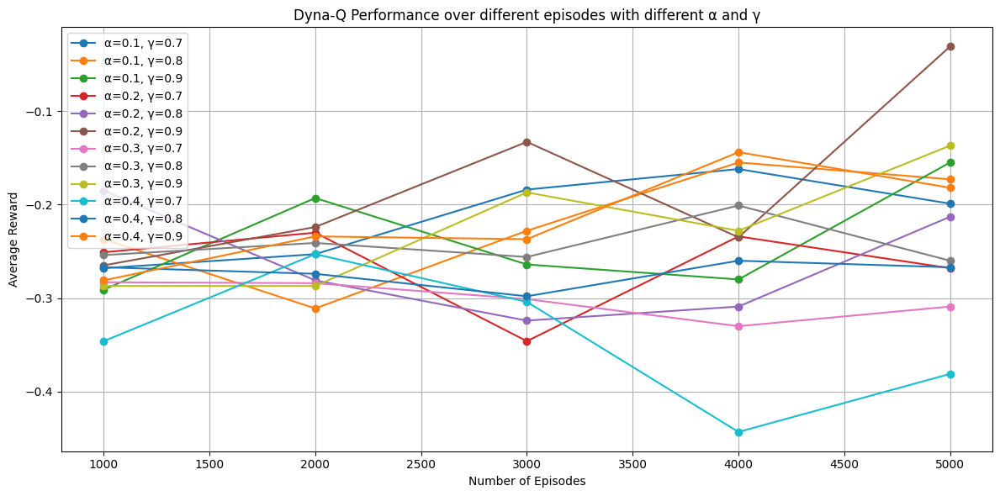

In [6]:
plot_evaluation_results(results)

# Dyna Q+

In [7]:
results2 = dyna_q_testing(k=0.015)

Current state: player's sum 21, dealer's card: 1. Action taken: 1
Current state: player's sum 21, dealer's card: 1. Action taken: 0
Current state: player's sum 13, dealer's card: 5. Action taken: 1
Current state: player's sum 13, dealer's card: 5. Action taken: 0
Current state: player's sum 20, dealer's card: 10. Action taken: 0
Current state: player's sum 22, dealer's card: 10. Action taken: 1
Current state: player's sum 21, dealer's card: 10. Action taken: 0
Current state: player's sum 17, dealer's card: 5. Action taken: 1
Current state: player's sum 19, dealer's card: 5. Action taken: 1
Current state: player's sum 19, dealer's card: 5. Action taken: 0
Current state: player's sum 21, dealer's card: 9. Action taken: 1
Current state: player's sum 21, dealer's card: 9. Action taken: 0
Current state: player's sum 20, dealer's card: 10. Action taken: 1
Current state: player's sum 20, dealer's card: 10. Action taken: 0
Current state: player's sum 20, dealer's card: 7. Action taken: 0
Curre

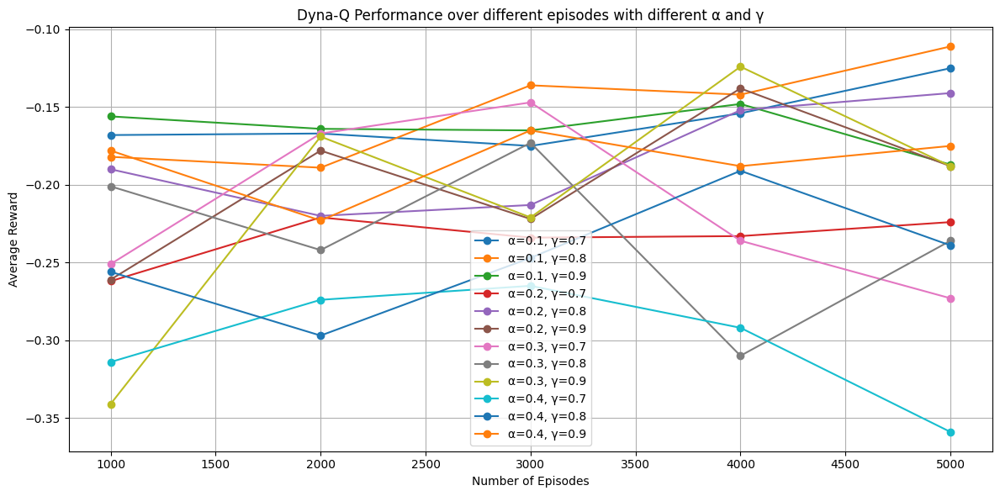

In [8]:
plot_evaluation_results(results2)

# Dyna Q with Prioritize Sweeping

In [11]:
def dyna_Q_PS_testing(theta=0.1,
                      alpha_values=[0.1, 0.2, 0.3, 0.4],
                      gamma_values=[0.9, 0.8, 0.7],
                      episodes_list=[1000, 2000, 3000, 4000, 5000],
                      planning_steps=10,
                      n_episodes=1000):
    results = []

    for alpha, gamma, episodes in product(alpha_values, gamma_values, episodes_list):
        env = gym.make("Blackjack-v1")

        # Assumes you have implemented dyna_Q_prioritized_sweeping method
        Q, _ = PS_DynaQ(env, alpha=alpha, gamma=gamma, planning_steps=planning_steps, episodes=episodes, theta=theta)

        avg_reward = evaluate_policy(env, Q, episodes=n_episodes)
        results.append((alpha, gamma, episodes, avg_reward))
        print(f"α={alpha}, γ={gamma}, episodes={episodes} → avg_reward={avg_reward:.3f}")

    return results

In [ ]:
pq_results = dyna_Q_PS_testing()

Current state: player's sum 15, dealer's card: 10. Action taken: 1
Current state: player's sum 22, dealer's card: 10. Action taken: 1
Current state: player's sum 19, dealer's card: 6. Action taken: 0
Current state: player's sum 22, dealer's card: 7. Action taken: 1
Current state: player's sum 14, dealer's card: 1. Action taken: 1
Current state: player's sum 22, dealer's card: 1. Action taken: 1
Current state: player's sum 15, dealer's card: 7. Action taken: 1
Current state: player's sum 21, dealer's card: 7. Action taken: 1
Current state: player's sum 21, dealer's card: 7. Action taken: 1
Current state: player's sum 21, dealer's card: 7. Action taken: 0
Current state: player's sum 20, dealer's card: 10. Action taken: 1
Current state: player's sum 25, dealer's card: 10. Action taken: 1
Current state: player's sum 22, dealer's card: 10. Action taken: 1
Current state: player's sum 29, dealer's card: 5. Action taken: 1
Current state: player's sum 19, dealer's card: 10. Action taken: 1
Curr

In [ ]:
plot_evaluation_results(pq_results)